In [4]:
import csv
import ast
import networkx as nx

G = nx.Graph()

with open('../exports/adjacency_2024-04-07.csv', 'r') as csvfile:
  csvreader = csv.reader(csvfile)
  for row in csvreader:
    node = row[0]
    connected_nodes = ast.literal_eval(row[1])
    
    for connected_node in connected_nodes:
      G.add_edge(node, connected_node)


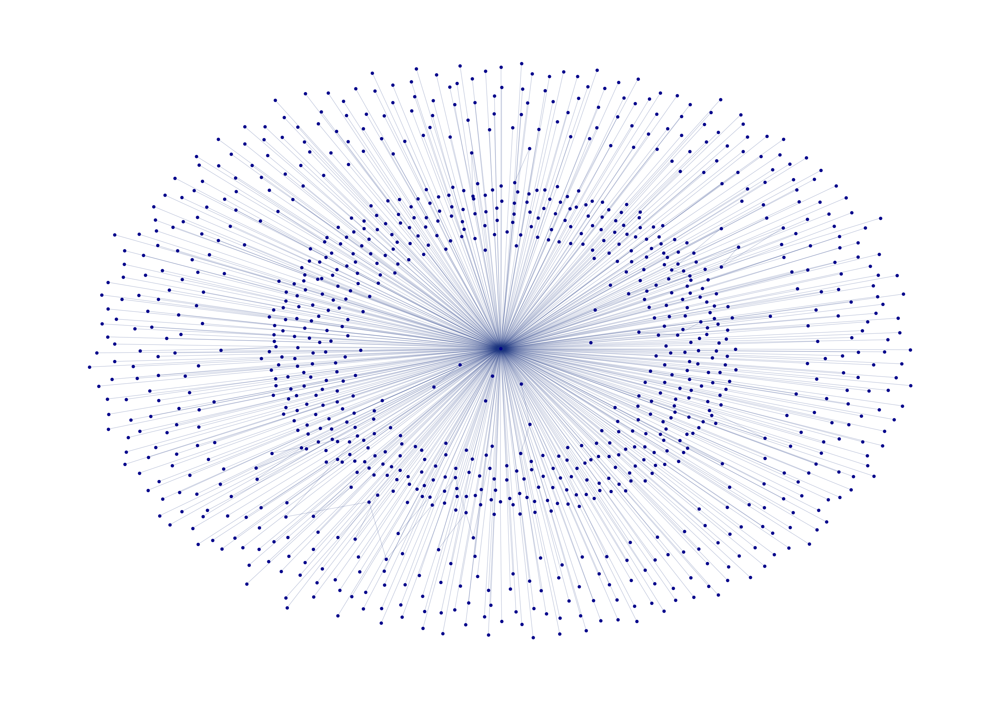

In [9]:
import matplotlib.pyplot as plt

plt.figure(figsize=(30, 21)) 
nx.draw(G, 
        pos = nx.spring_layout(G),
        with_labels = False, 
        font_size = 16, 
        node_size = 40, 
        node_color = 'darkblue', 
        edge_color = (0.1, 0.2, 0.5, 0.3)
       )
plt.show()

# empty articles are connected to each other
# the embeddings start to behave weirdly if theres not much data

In [14]:
# get the node with the highest degree

for node in G.nodes():
  if G.degree(node) > 100:
    print(node, G.degree(node))

# G.remove_node('39409535')

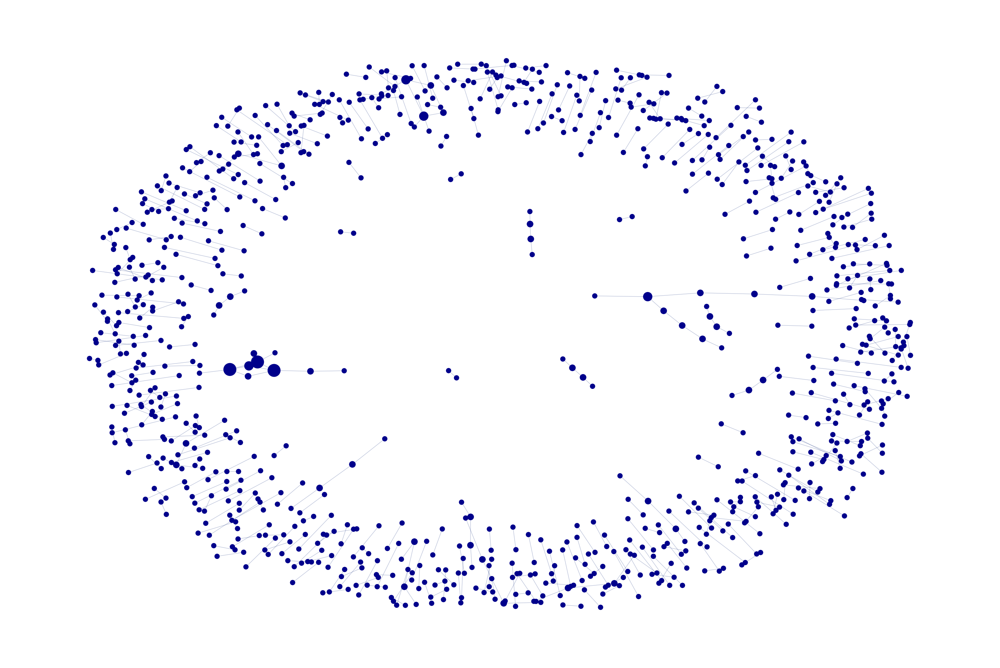

In [23]:
# going again
# also setting the node size to be proportional to the degree of the node

plt.figure(figsize=(30, 20)) 
nx.draw(G, 
        pos = nx.spring_layout(G, k=0.1),
        with_labels = False, 
        node_size = [10 * G.degree(node) ** 3 + 100 for node in G.nodes()], # more edges == bigger node
        node_color = 'darkblue', 
        edge_color = (0.1, 0.2, 0.5, 0.3)
       )
plt.show()

In [29]:
# adding labels to the most connected nodes + the outliers
# hypothesis being I can derive most trending topic clusters from this
threshold = 2
important_nodes = [node for node, degree in dict(G.degree()).items() if degree > threshold] 
important_nodes += [node for node, degree in dict(G.degree()).items() if degree == 0] 

In [41]:
# get data on the nodes

def get_labels(nodes):
    labels = {id: None for id in nodes}
    import csv
    with open('../exports/export_2024-04-07.csv', 'r') as csvfile:
      csv = csv.reader(csvfile)
      for row in csv:
        id, title, date, keywords= row
        if id in labels:
          labels[id] = title, keywords
    return labels


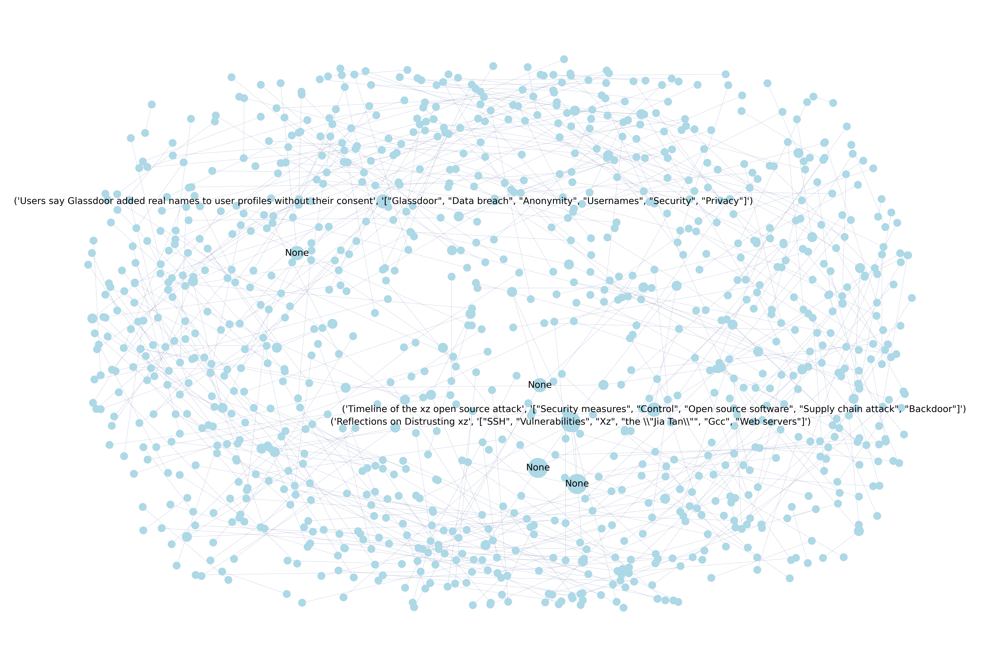

In [54]:
plt.figure(figsize=(60, 40)) 

pos = nx.spring_layout(G, k=0.1, weight='weight', iterations=10)
labels = get_labels(important_nodes)

nx.draw(G, 
        pos,
        labels = labels, 
        font_size = 40, 
        node_size = [100 * G.degree(node) ** 3 + 1000 for node in G.nodes()],
        node_color = 'lightblue', 
        edge_color = (0.1, 0.2, 0.5, 0.3)
       )

plt.show()

In [ ]:
# the most connected nodes here actually represent the most trending topics 
# in the community recently!